# Domain to domain translation using pix2pix with custom data

See the [original paper page](https://phillipi.github.io/pix2pix). Based on [this implementation](https://github.com/tjwei/GANotebooks/blob/master/pix2pix-keras.ipynb) and edited for the purposes of the class. Added lots of exposed code. Alternative repo to check out is [here](https://github.com/bapoczos/ArtML/tree/master/Pix2Pix).


In [1]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


# 1A get data from existing dataset

> **Vitek's note:**
> We get some *reasonable* quality even with just 400 images in 256x256 resolution!
>
> Dataset "facades" has 400 images in training set, 100 images in validation set. Sample image pair: A: (256, 256, 3), B: (256, 256, 3)


In [2]:
!wget https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz
!mkdir datasets
!tar -zxf facades.tar.gz -C datasets/
!rm facades.tar.gz

--2021-03-12 19:52:05--  https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30168306 (29M) [application/x-gzip]
Saving to: ‘facades.tar.gz’

facades.tar.gz      100%[===================>]  28.77M  4.65MB/s    in 6.3s    

2021-03-12 19:52:12 (4.53 MB/s) - ‘facades.tar.gz’ saved [30168306/30168306]



This data is already prepared for the pix2pix - you can directly jump to the **"3 train pix2pix"** section.

# 1B get new data, convert images to edges

> **Vitek's note:**
> We will get pretty messy results with this ...

As a demo we will get a sample dataset of cat images - but we could upload anything else, or even scrape images for example from youtube ...

In [3]:
!wget -q --no-check-certificate https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
!unzip -q cats_and_dogs_filtered.zip
!ls cats_and_dogs_filtered/train/
!rm cats_and_dogs_filtered.zip

cats  dogs


## Inspect it:

total 1000 files!
cats_and_dogs_filtered/train/cats/cat.0.jpg = (374, 500, 3)
cats_and_dogs_filtered/train/cats/cat.1.jpg = (280, 300, 3)
cats_and_dogs_filtered/train/cats/cat.10.jpg = (499, 489, 3)
cats_and_dogs_filtered/train/cats/cat.100.jpg = (499, 403, 3)
cats_and_dogs_filtered/train/cats/cat.101.jpg = (200, 296, 3)
cats_and_dogs_filtered/train/cats/cat.102.jpg = (343, 349, 3)
cats_and_dogs_filtered/train/cats/cat.103.jpg = (386, 500, 3)
cats_and_dogs_filtered/train/cats/cat.104.jpg = (399, 253, 3)
cats_and_dogs_filtered/train/cats/cat.105.jpg = (174, 215, 3)
cats_and_dogs_filtered/train/cats/cat.106.jpg = (374, 400, 3)


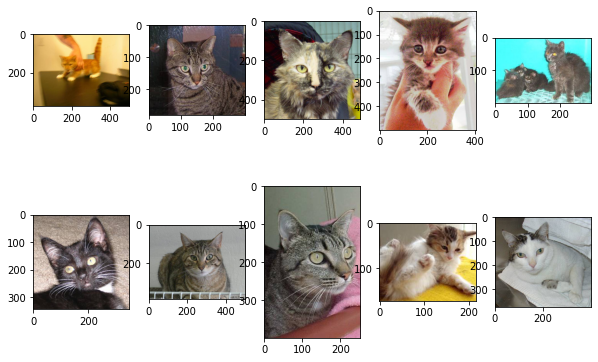

In [4]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

folder = "cats_and_dogs_filtered/train/cats/*"
files = glob.glob(folder)
files.sort()

print("total", len(files),"files!")

plt.figure(figsize=(10,10))
columns = 5
show_subset = 10

for i, img_path in enumerate(files[:show_subset]):
    image = mpimg.imread(img_path)
    print(img_path, "=", image.shape)

    plt.subplot(show_subset / columns + 1, columns, i + 1)
    plt.imshow(image)

# 1C Flowers dataset

In [5]:
!wget http://download.tensorflow.org/example_images/flower_photos.tgz
!tar -zxf flower_photos.tgz
!rm flower_photos.tgz

--2021-03-12 19:52:16--  http://download.tensorflow.org/example_images/flower_photos.tgz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.20.128, 2607:f8b0:400e:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.20.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 228813984 (218M) [application/x-compressed-tar]
Saving to: ‘flower_photos.tgz’

flower_photos.tgz   100%[===================>] 218.21M   120MB/s    in 1.8s    

2021-03-12 19:52:18 (120 MB/s) - ‘flower_photos.tgz’ saved [228813984/228813984]



# 2 process data

In [6]:
# Choose your preference or plug in your own data

#my_data_lives_at = "/content/cats_and_dogs_filtered/train/cats/"
my_data_lives_at = "/content/flower_photos/daisy/"

## Resize to the same sizes

In [7]:
input_folder = my_data_lives_at
target_edges_folder = "/content/resized/"
resolution = 256

assert input_folder[-1] == "/" # end with /
assert target_edges_folder[-1] == "/"

import os
import cv2
from tqdm import tqdm
from PIL import Image, ImageOps


def padding(img, expected_size):
    desired_size = expected_size
    delta_width = desired_size - img.size[0]
    delta_height = desired_size - img.size[1]
    pad_width = delta_width // 2
    pad_height = delta_height // 2
    padding = (pad_width, pad_height, delta_width - pad_width, delta_height - pad_height)
    return ImageOps.expand(img, padding)


def resize_with_padding(img, expected_size):
    img.thumbnail((expected_size, expected_size))
    # print(img.size)
    delta_width = expected_size - img.size[0]
    delta_height = expected_size - img.size[1]
    pad_width = delta_width // 2
    pad_height = delta_height // 2
    padding = (pad_width, pad_height, delta_width - pad_width, delta_height - pad_height)
    return ImageOps.expand(img, padding)


def pad_resize_on_folder(input_folder, target_edges_folder):

  # input
  files = os.listdir(input_folder)
  
  # output
  if not os.path.exists(target_edges_folder):
      os.makedirs(target_edges_folder)

  print("processing", len(files), "images")

  resized = []
  for f in tqdm(files):
    img = Image.open(input_folder+f)
    resized_img = resize_with_padding(img,resolution)
    resized_img.save(target_edges_folder+f) 

pad_resize_on_folder(input_folder, target_edges_folder)

  3%|▎         | 20/633 [00:00<00:03, 199.50it/s]

processing 633 images


100%|██████████| 633/633 [00:03<00:00, 178.48it/s]


## Use edge detector

Note that the original pix2pix paper was using a more advanced "image 2 edge" transform (namely [this one](https://github.com/s9xie/hed)), but it's a bit of pain to make run (uses python2 and older Caffe library) and quite slow.

We will use a simple Canny filter: https://en.wikipedia.org/wiki/Canny_edge_detector

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


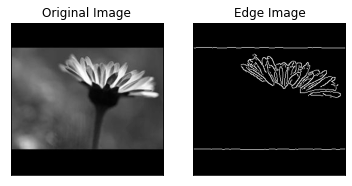

In [8]:
# Edge detection with a simple Canny filter
# canny ~ https://en.wikipedia.org/wiki/Canny_edge_detector

import numpy as np
import cv2
from matplotlib import pyplot as plt
files = os.listdir("/content/resized/")

img = cv2.imread('/content/resized/'+files[0],0)
print(img)
edges = cv2.Canny(img,100,200)
plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

In [9]:
# Let's run it on the whole folder ...

%cd /content
input_folder = "/content/resized/"
target_edges_folder = "/content/edges/"

assert input_folder[-1] == "/" # end with /
assert target_edges_folder[-1] == "/"

import numpy as np
import cv2
import os
from tqdm import tqdm

def img2edge(img):
  return cv2.Canny(img,100,200)

def img2edge_on_folder(input_folder, target_edges_folder):

  # input
  files = os.listdir(input_folder)

  # output
  if not os.path.exists(target_edges_folder):
      os.makedirs(target_edges_folder)

  print("processing", len(files), "images")

  for f in tqdm(files):
    img = cv2.imread(input_folder+f,0)
    edge = img2edge(img)
    cv2.imwrite(target_edges_folder+f, edge) 

img2edge_on_folder(input_folder, target_edges_folder)

  0%|          | 0/633 [00:00<?, ?it/s]

/content
processing 633 images


100%|██████████| 633/633 [00:01<00:00, 574.83it/s]


## Combine images (for pix2pix)

In [10]:
A_folder = "/content/resized/"
B_folder = "/content/edges/"
output_folder = "/content/combined/"
subset = None # we can select a subset here

if True:
    img_fold_A = os.path.join(A_folder)
    img_fold_B = os.path.join(B_folder)
    img_list = filter( lambda f: not f.startswith('.'), os.listdir(img_fold_A)) # ignore hidden folders like .DS_Store
    img_list = list(img_list)
    print("Will combine", len(img_list), "pairs")

    num_imgs = len(img_list)
    if subset is not None:
      num_imgs = min(subset, len(img_list))
    if not os.path.isdir(output_folder):
        os.makedirs(output_folder)
    for n in range(num_imgs):
        name_A = img_list[n]
        path_A = os.path.join(img_fold_A, name_A)
        name_B = name_A
        path_B = os.path.join(img_fold_B, name_B)

        if os.path.isfile(path_A) and os.path.isfile(path_B):
            name_AB = name_A
            path_AB = os.path.join(output_folder, name_AB)
            im_A = cv2.imread(path_A, cv2.IMREAD_COLOR)
            im_B = cv2.imread(path_B, cv2.IMREAD_COLOR)
            im_AB = np.concatenate([im_A, im_B], 1)
            cv2.imwrite(path_AB, im_AB)

Will combine 633 pairs


In [ ]:
# Split into train/val set

import random
import glob
import os

def split(folder, train_frac=0.8, shuffle=True): 
    files = glob.glob(os.path.join(folder, "*.jpg"))
    files.sort()

    assignments = []
    assignments.extend(["train"] * int(train_frac * len(files)))
    assignments.extend(["val"] * int(len(files) - len(assignments)))

    if shuffle:
        random.shuffle(assignments)

    for name in ["train", "val", "test"]:
        if name in assignments:
            d = os.path.join(folder, name)
            if not os.path.exists(d):
                os.makedirs(d)

    print(len(files), len(assignments))
    for inpath, assignment in zip(files, assignments):
        outpath = os.path.join(folder, assignment, os.path.basename(inpath))
        #print(inpath, "->", outpath)
        os.rename(inpath, outpath)

split("/content/combined/")

In [12]:
!ls /content/combined

train  val


# 3 train pix2pix

## Configuration and imports

In [13]:
%cd /content/

import os
os.environ['KERAS_BACKEND']='tensorflow'
import keras.backend as K
K.set_image_data_format('channels_last')
channel_axis=-1
channel_first = False

from keras.models import Sequential, Model
from keras.layers import Conv2D, ZeroPadding2D, BatchNormalization, Input, Dropout
from keras.layers import Conv2DTranspose, Reshape, Activation, Cropping2D, Flatten
from keras.layers import Concatenate
from keras.layers.advanced_activations import LeakyReLU
from keras.activations import relu
from keras.initializers import RandomNormal

/content


Using TensorFlow backend.


## Generator and Discriminator:

In [14]:
# Weights initializations
# bias are initailized as 0
conv_init = RandomNormal(0, 0.02) #  # for convolution kernel
gamma_init = RandomNormal(1., 0.02) # for batch normalization

# Basic discriminator
def conv2d(f, *a, **k):
    return Conv2D(f, kernel_initializer = conv_init, *a, **k)
def batchnorm():
    return BatchNormalization(momentum=0.9, axis=channel_axis, epsilon=1.01e-5,
                                   gamma_initializer = gamma_init)

def BASIC_D(nc_in, nc_out, ndf, max_layers=3):
    """DCGAN_D(nc, ndf, max_layers=3)
       nc: channels
       ndf: filters of the first layer
       max_layers: max hidden layers
    """    
    if channel_first:
        input_a, input_b =  Input(shape=(nc_in, None, None)), Input(shape=(nc_out, None, None))
    else:
        input_a, input_b = Input(shape=(None, None, nc_in)), Input(shape=(None, None, nc_out))
    _ = Concatenate(axis=channel_axis)([input_a, input_b])
    _ = conv2d(ndf, kernel_size=4, strides=2, padding="same", name = 'First') (_)
    _ = LeakyReLU(alpha=0.2)(_)
    
    for layer in range(1, max_layers):        
        out_feat = ndf * min(2**layer, 8)
        _ = conv2d(out_feat, kernel_size=4, strides=2, padding="same", 
                   use_bias=False, name = 'pyramid.{0}'.format(layer)             
                        ) (_)
        _ = batchnorm()(_, training=1)        
        _ = LeakyReLU(alpha=0.2)(_)
    
    out_feat = ndf*min(2**max_layers, 8)
    _ = ZeroPadding2D(1)(_)
    _ = conv2d(out_feat, kernel_size=4,  use_bias=False, name = 'pyramid_last') (_)
    _ = batchnorm()(_, training=1)
    _ = LeakyReLU(alpha=0.2)(_)
    
    # final layer
    _ = ZeroPadding2D(1)(_)
    _ = conv2d(1, kernel_size=4, name = 'final'.format(out_feat, 1), 
               activation = "sigmoid") (_)    
    return Model(inputs=[input_a, input_b], outputs=_)

In [15]:
def UNET_G(isize, nc_in=3, nc_out=3, ngf=64, fixed_input_size=True):    
    max_nf = 8*ngf    
    def block(x, s, nf_in, use_batchnorm=True, nf_out=None, nf_next=None):
        # print("block",x,s,nf_in, use_batchnorm, nf_out, nf_next)
        assert s>=2 and s%2==0
        if nf_next is None:
            nf_next = min(nf_in*2, max_nf)
        if nf_out is None:
            nf_out = nf_in
        x = conv2d(nf_next, kernel_size=4, strides=2, use_bias=(not (use_batchnorm and s>2)),
                   padding="same", name = 'conv_{0}'.format(s)) (x)
        if s>2:
            if use_batchnorm:
                x = batchnorm()(x, training=1)
            x2 = LeakyReLU(alpha=0.2)(x)
            x2 = block(x2, s//2, nf_next)
            x = Concatenate(axis=channel_axis)([x, x2])            
        x = Activation("relu")(x)
        x = Conv2DTranspose(nf_out, kernel_size=4, strides=2, use_bias=not use_batchnorm,
                            kernel_initializer = conv_init,          
                            name = 'convt.{0}'.format(s))(x)        
        x = Cropping2D(1)(x)
        if use_batchnorm:
            x = batchnorm()(x, training=1)
        if s <=8:
            x = Dropout(0.5)(x, training=1)
        return x
    
    s = isize if fixed_input_size else None
    if channel_first:
        _ = inputs = Input(shape=(nc_in, s, s))
    else:
        _ = inputs = Input(shape=(s, s, nc_in))        
    _ = block(_, isize, nc_in, False, nf_out=nc_out, nf_next=ngf)
    _ = Activation('tanh')(_)
    return Model(inputs=inputs, outputs=[_])

In [16]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

channels_in = 3   # number of input channels ~ for RGB images 3
channels_out = 3  # number of output channels
generator_features = 64    # generator feature
discriminator_features = 64    # discriminator feature

loadSize = 286
imageSize = 256   # resolution of the loaded images

netD = BASIC_D(channels_in, channels_out, discriminator_features)
#netD.summary()

netG = UNET_G(imageSize, channels_in, channels_out, generator_features)
#SVG(model_to_dot(netG, show_shapes=True).create(prog='dot', format='svg'))
#netG.summary()


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [17]:
from keras.optimizers import RMSprop, SGD, Adam

real_A = netG.input
fake_B = netG.output
netG_generate = K.function([real_A], [fake_B])
real_B = netD.inputs[1]
output_D_real = netD([real_A, real_B])
output_D_fake = netD([real_A, fake_B])


#loss_fn = lambda output, target : K.mean(K.binary_crossentropy(output, target))
loss_fn = lambda output, target : -K.mean(K.log(output+1e-12)*target+K.log(1-output+1e-12)*(1-target))

loss_D_real = loss_fn(output_D_real, K.ones_like(output_D_real))
loss_D_fake = loss_fn(output_D_fake, K.zeros_like(output_D_fake))
loss_G_fake = loss_fn(output_D_fake, K.ones_like(output_D_fake))

loss_L1 = K.mean(K.abs(fake_B-real_B))

lrD = 2e-4
lrG = 2e-4

# Loss Discriminator
loss_D = loss_D_real +loss_D_fake
training_updates = Adam(lr=lrD, beta_1=0.5).get_updates(netD.trainable_weights,[],loss_D)
netD_train = K.function([real_A, real_B],[loss_D/2], training_updates)

# Loss Generator
loss_G = loss_G_fake   + 100 * loss_L1
training_updates = Adam(lr=lrG, beta_1=0.5).get_updates(netG.trainable_weights,[], loss_G)
netG_train = K.function([real_A, real_B], [loss_G_fake, loss_L1], training_updates)

## Dataset loading:

In [18]:
from PIL import Image
import numpy as np
import glob
from random import randint, shuffle

%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import display
def showX(X, rows=1):
    assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).clip(0,255).astype('uint8')
    if channel_first:
        int_X = np.moveaxis(int_X.reshape(-1,3,imageSize,imageSize), 1, 3)
    else:
        int_X = int_X.reshape(-1,imageSize,imageSize, 3)
    int_X = int_X.reshape(rows, -1, imageSize, imageSize,3).swapaxes(1,2).reshape(rows*imageSize,-1, 3)
    display(Image.fromarray(int_X))
    
def load_data(file_pattern):
    return glob.glob(file_pattern)
def read_image(fn, direction=0):
    im = Image.open(fn)
    im = im.resize( (loadSize*2, loadSize), Image.BILINEAR )
    arr = np.array(im).astype(float)
    arr=arr/255*2-1
    #arr = np.array(im)
    w1,w2 = int((loadSize-imageSize)/2),int((loadSize+imageSize)/2)
    h1,h2 = int(w1),int(w2)
    #print(w1,w2,h1,h2)
    imgA = arr[h1:h2, loadSize+w1:loadSize+w2, :]
    imgB = arr[h1:h2, w1:w2, :]
    if randint(0,1):
        imgA=imgA[:,::-1]
        imgB=imgB[:,::-1]
    if channel_first:
        imgA = np.moveaxis(imgA, 2, 0)
        imgB = np.moveaxis(imgB, 2, 0)
    if direction==0:
        return imgA, imgB
    else:
        return imgB,imgA

def minibatch(dataAB, batchsize, direction=0):
    length = len(dataAB)
    epoch = i = 0
    tmpsize = None
    while True:
        size = tmpsize if tmpsize else batchsize
        if i+size > length:
            shuffle(dataAB)
            i = 0
            epoch+=1        
        dataA = []
        dataB = []
        for j in range(i,i+size):
            imgA,imgB = read_image(dataAB[j], direction)
            dataA.append(imgA)
            dataB.append(imgB)
        dataA = np.float32(dataA)
        dataB = np.float32(dataB)
        i+=size
        tmpsize = yield epoch, dataA, dataB        
        

In [19]:
"""
#Option if we loaded data from 1A
data = "facades"
direction = 0
trainAB = load_data('datasets/{}/train/*.jpg'.format(data))
valAB = load_data('datasets/{}/val/*.jpg'.format(data))
"""

#Option if we used our own data from 1B

data = "edges2images"
direction = 0
trainAB = load_data('/content/combined/train/*.jpg')
valAB = load_data('/content/combined/val/*.jpg')

assert len(trainAB) and len(valAB)

print("Loaded dataset:", data)
print(len(trainAB), "images in training set,", len(valAB), "images in validation set")

imgA,imgB = read_image(trainAB[0], direction=0)
print("sample image pair: A:",imgA.shape, ", B:", imgB.shape)

Loaded dataset: edges2images
506 images in training set, 127 images in validation set
sample image pair: A: (256, 256, 3) , B: (256, 256, 3)


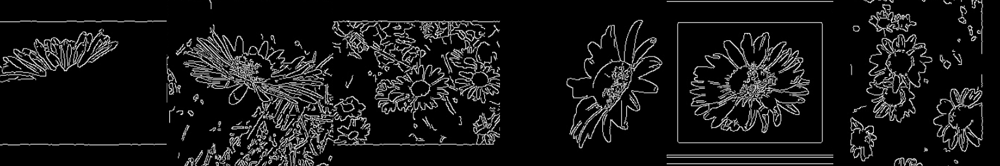

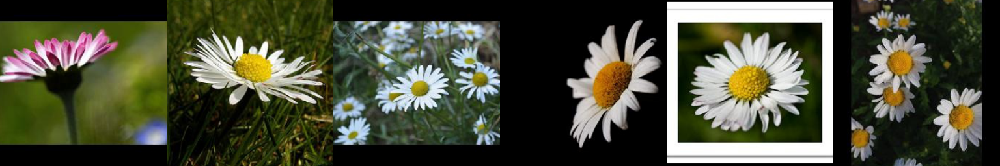

In [20]:
# Let's look at 6 random samples:

train_batch = minibatch(trainAB, 6, direction=0)
_, trainA, trainB = next(train_batch)
showX(trainA)
showX(trainB)

## Training:

*(keeps last few outputs in the log)*

In [21]:
number_of_epochs = 50    ### number of epochs  # 10 is enough for first demos
batchSize = 128           ### batch size ~ how many images are loaded in the memory at the same time
                          # Note: you will probably need to lower this number on your own PCs...
                          # 128 was the max I got out of Colab
  
# notes from training with flowers
# - until around 15 epochs gets white ghosty like shapes, mostly just white and green
# - after 30 we get yellows
# - after 44 suddenly blues ~

[49/50][150] Loss_D: 0.532300 Loss_G: 1.505786 loss_L1: 0.209247 938.5446882247925


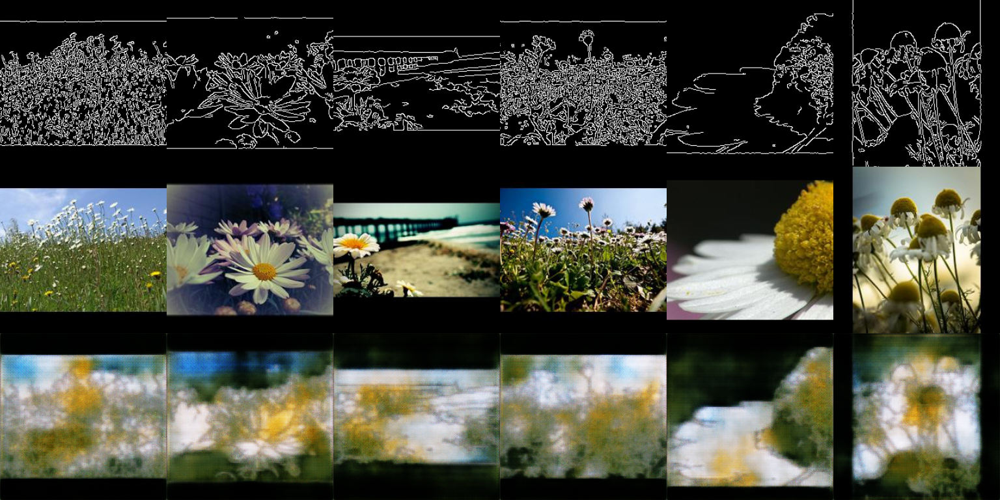

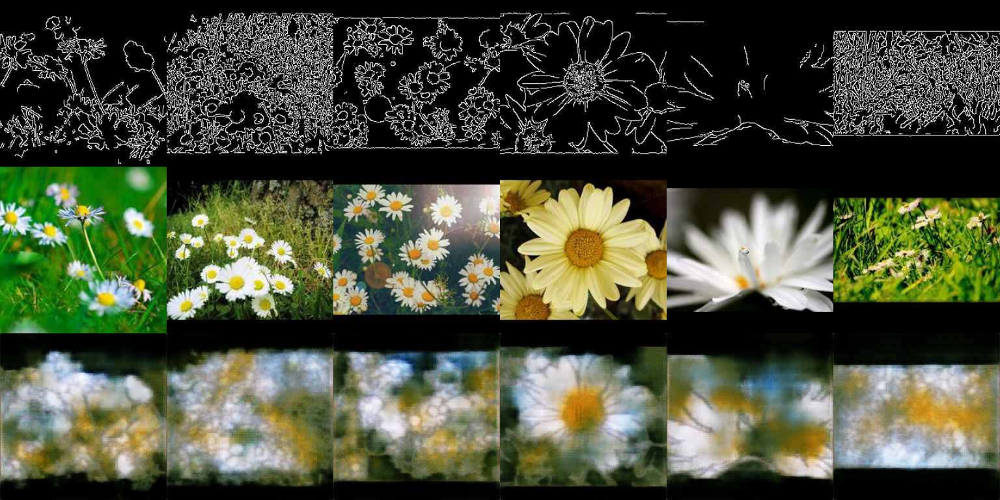

In [22]:
import time
from IPython.display import clear_output
t0 = time.time()
gen_iterations = 0
errL1 = epoch = errG = 0
errL1_sum = errG_sum = errD_sum = 0

display_iters = int(500 / batchSize)   ### How often should we visualize output
val_batch = minibatch(valAB, 6, direction)
train_batch = minibatch(trainAB, batchSize, direction)

def netG_gen(A):
    return np.concatenate([netG_generate([A[i:i+1]])[0] for i in range(A.shape[0])], axis=0)

while epoch < number_of_epochs: 
    epoch, trainA, trainB = next(train_batch)        
    errD,  = netD_train([trainA, trainB])
    errD_sum +=errD

    errG, errL1 = netG_train([trainA, trainB])
    errG_sum += errG
    errL1_sum += errL1
    gen_iterations+=1
    if gen_iterations%display_iters==0:
        if gen_iterations%(5*display_iters)==0:
            clear_output()
        print('[%d/%d][%d] Loss_D: %f Loss_G: %f loss_L1: %f'
        % (epoch, number_of_epochs, gen_iterations, errD_sum/display_iters, errG_sum/display_iters, errL1_sum/display_iters), time.time()-t0)
        _, valA, valB = train_batch.send(6) 
        fakeB = netG_gen(valA)
        showX(np.concatenate([valA, valB, fakeB], axis=0), 3)
        errL1_sum = errG_sum = errD_sum = 0
        _, valA, valB = next(val_batch)
        fakeB = netG_gen(valA)
        showX(np.concatenate([valA, valB, fakeB], axis=0), 3)
        

Inference:

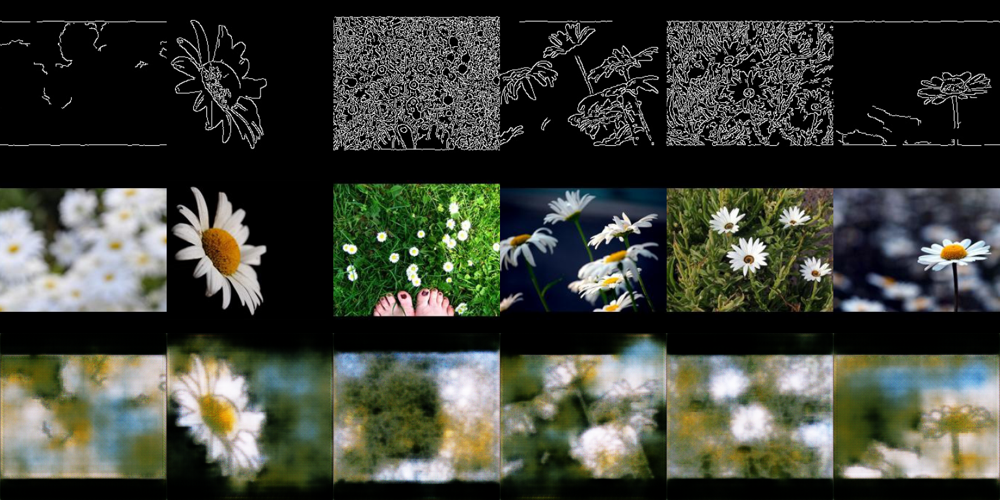

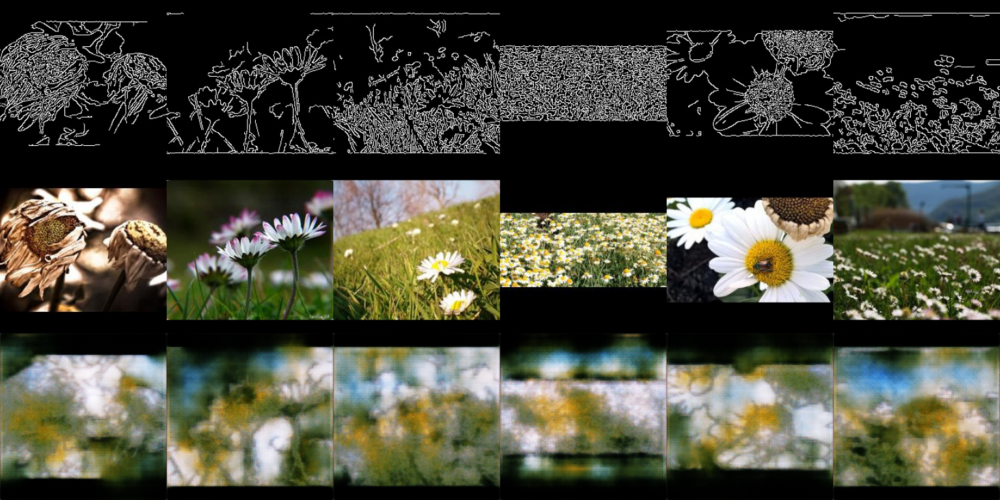

In [23]:
_, valA, valB = train_batch.send(6) 
fakeB = netG_gen(valA)
showX(np.concatenate([valA, valB, fakeB], axis=0), 3)
errL1_sum = errG_sum = errD_sum = 0
_, valA, valB = next(val_batch)
fakeB = netG_gen(valA)
showX(np.concatenate([valA, valB, fakeB], axis=0), 3)

## Optionally save/load the models:



In [24]:
if False:
  # Save netG and netD
  print(netG)
  print(netD)

  %cd /content/
  netG.save_weights('last_netG_w.h5')
  netD.save_weights('last_netD_w.h5')

In [25]:
if False: 
  # Or load from an older saved model
  !gdown https://drive.google.com/uc?id=1N2LvgfyRAJYEPpc352og24UzBrCdcJgn

  netG.load_weights('last_netG_w.h5')

# 4 Inference, using the pix2pix model

(1, 256, 256, 3)
(1, 256, 256, 3)


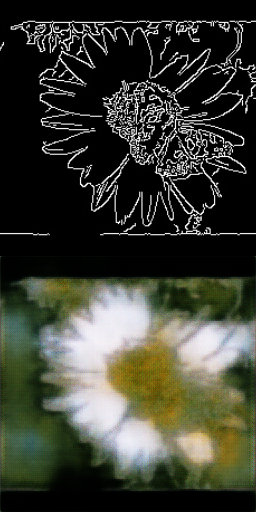

In [26]:
# One image:
_, inputImage, _ = train_batch.send(1)
print(inputImage.shape)

output = netG.predict(inputImage)
print(output.shape)

showX(np.concatenate([inputImage, output], axis=0), 2)

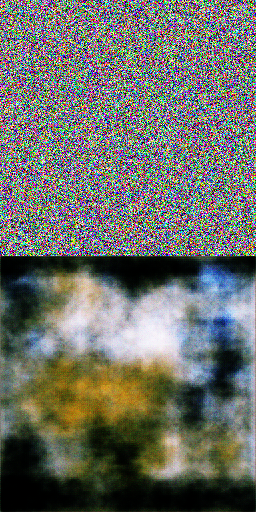

In [27]:
# Random noise:
import numpy as np
random_noise = np.random.randn(1, 256, 256, 3)

generatedImage = netG.predict(random_noise)
showX(np.concatenate([random_noise, generatedImage], axis=0), 2)

We can also try the model with images that are not from our dataset ... we must remember to apply all the transforms in the same manner as we did with the data in the training dataset.

In [28]:
import cv2
import numpy as np

imposter = "/content/cats_and_dogs_filtered/validation/dogs/dog.2001.jpg"

img = cv2.imread(imposter,0)
edge = img2edge(img)
cv2.imwrite("test.jpg", edge)

True

(256, 256, 3)


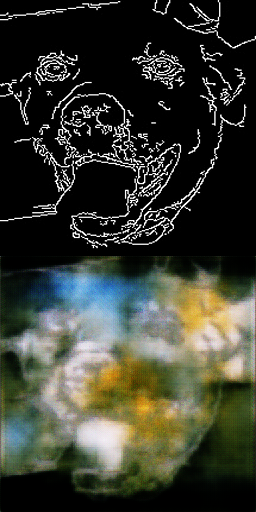

In [29]:
img = cv2.imread("test.jpg")
res = cv2.resize(img, dsize=(256, 256), interpolation=cv2.INTER_CUBIC)
res = res/255*2-1

print(res.shape)

loaded_image = np.reshape(res, (1, 256, 256, 3))

generatedImage = netG.predict(loaded_image)
showX(np.concatenate([loaded_image, generatedImage], axis=0), 2)

--2021-03-12 20:11:08--  https://distill.pub/2017/aia/images/bread-cat-input.jpg
Resolving distill.pub (distill.pub)... 151.101.65.195, 151.101.1.195
Connecting to distill.pub (distill.pub)|151.101.65.195|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38168 (37K) [image/jpeg]
Saving to: ‘bread-cat-input.jpg.2’

bread-cat-input.jpg 100%[===================>]  37.27K  --.-KB/s    in 0.003s  

2021-03-12 20:11:09 (12.9 MB/s) - ‘bread-cat-input.jpg.2’ saved [38168/38168]

(256, 256, 3)


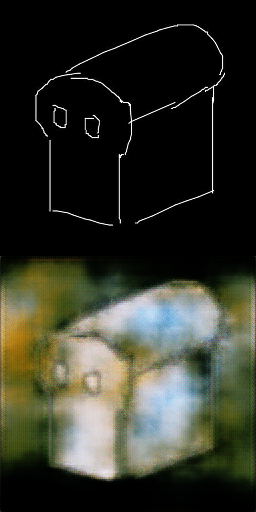

In [39]:
# Get a test image ...
# ... note that this is already in the edges representation ...
!wget https://distill.pub/2017/aia/images/bread-cat-input.jpg

img = cv2.imread("bread-cat-input.jpg")
img = (255-img) # invert it
res = cv2.resize(img, dsize=(256, 256), interpolation=cv2.INTER_CUBIC)
res = res/255*2-1

print(res.shape)

loaded_image = np.reshape(res, (1, 256, 256, 3))

generatedImage = netG.predict(loaded_image)
showX(np.concatenate([loaded_image, generatedImage], axis=0), 2)

# (bonus) copy models to your drive

In [ ]:
assert False
# Don't continue even if we started with a "run all" command

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [33]:
!mkdir /content/gdrive/MyDrive/SavedModels

In [35]:
# back up the models
!cp *.h5 /content/gdrive/MyDrive/SavedModels/

In [ ]:
!ls /content/gdrive/MyDrive/SavedModels/

In [ ]:
# or load them back with
# !cp /content/gdrive/MyDrive/SavedModels/*.h5 /content/